<a href="https://colab.research.google.com/github/abroniewski/Child-Wasting-Prediction/blob/acled-eda/notebooks/Acled_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

EDA of Conflict Data

In [1]:
#!pip install geopandas
#!pip install Shapely
#!pip install matplotlib

In [3]:
# General imports
from pandas_profiling import ProfileReport

# Plotting imports
%matplotlib inline
import matplotlib.pyplot as plt # plotting
import numpy as np 
import seaborn as sns
import pandas as pd
import plotly.express as px


ModuleNotFoundError: No module named 'shapely'

In [ ]:
# Configuration setting
data_dir = "https://github.com/abroniewski/Child-Wasting-Prediction/blob/78fa5e54bef40e650619398905dadb7a56241887/data/raw/1900-01-01-2022-09-27-Eastern_Africa-Somalia.csv"


# For pandas
pd.options.display.max_columns = 200 # display upto 200 columns (instead of default 20)
pd.options.display.max_rows = 200 # display upto 200 rows (instead of default 60)

In [ ]:
# Read data
conflict_df = pd.read_csv(data_dir)

In [ ]:
conflict_df.head(5)

,data_id,iso,event_id_cnty,event_id_no_cnty,event_date,year,time_precision,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,region,country,admin1,admin2,admin3,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,timestamp,iso3
0,9499027,706,SOM38074,38074,23 September 2022,2022,1,Explosions/Remote violence,Shelling/artillery/missile attack,Al Shabaab,NaN,2,ATMIS: African Union Transition Mission in Som...,NaN,8,28,Eastern Africa,Somalia,Lower Juba,Kismaayo,NaN,Abdale Birole,-0.4906,42.1969,1,Calamada; Al Furqaan,National,"On 23 September 2022, Al Shabaab militants fir...",0,1664231916,SOM
1,9499028,706,SOM38075,38075,23 September 2022,2022,1,Battles,Armed clash,Al Shabaab,NaN,2,Military Forces of Somalia (2022-),NaN,1,12,Eastern Africa,Somalia,Lower Shabelle,Afgooye,NaN,Almada,2.2187,45.2087,1,Al Furqaan; Calamada,National,"On 23 September 2022, overnight, Al Shabaab mi...",0,1664231916,SOM
2,9499029,706,SOM38076,38076,23 September 2022,2022,1,Battles,Armed clash,Al Shabaab,NaN,2,ATMIS: African Union Transition Mission in Som...,NaN,8,28,Eastern Africa,Somalia,Lower Shabelle,Afgooye,NaN,Awbocow,1.9850,45.0018,1,Al Furqaan; Calamada,National,"On 23 September 2022, overnight, Al Shabaab mi...",0,1664231916,SOM
3,9499030,706,SOM38077,38077,23 September 2022,2022,1,Battles,Armed clash,Al Shabaab,NaN,2,Military Forces of Somalia (2022-),NaN,1,12,Eastern Africa,Somalia,Lower Shabelle,Afgooye,NaN,Lafoole,2.0833,45.1667,1,Calamada; Al Furqaan,National,"On 23 September 2022, overnight, Al Shabaab mi...",0,1664231916,SOM
4,9499189,706,SOM38009,38009,23 September 2022,2022,1,Explosions/Remote violence,Air/drone strike,Military Forces of the United States (2021-),Military Forces of Somalia (2022-) Special Forces,8,Al Shabaab,NaN,2,28,Eastern Africa,Somalia,Galgaduud,Ceel Buur,NaN,Ceel Buur,4.6815,46.6234,2,Radio Kulmiye,National,"On 23 September 2022, US forces in coordinatio...",0,1664231916,SOM


In [ ]:
# Basic checks
print(conflict_df.shape)


(37782, 31)


In [ ]:
# Dropping the unnecessary columns
df = conflict_df.drop(labels=['data_id','iso','event_id_cnty','event_id_no_cnty','year','region','country','geo_precision','timestamp','iso3'],axis=1)
df.head(2)

,event_date,time_precision,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,admin1,admin2,admin3,location,latitude,longitude,source,source_scale,notes,fatalities
0,23 September 2022,1,Explosions/Remote violence,Shelling/artillery/missile attack,Al Shabaab,NaN,2,ATMIS: African Union Transition Mission in Som...,NaN,8,28,Lower Juba,Kismaayo,NaN,Abdale Birole,-0.4906,42.1969,Calamada; Al Furqaan,National,"On 23 September 2022, Al Shabaab militants fir...",0
1,23 September 2022,1,Battles,Armed clash,Al Shabaab,NaN,2,Military Forces of Somalia (2022-),NaN,1,12,Lower Shabelle,Afgooye,NaN,Almada,2.2187,45.2087,Al Furqaan; Calamada,National,"On 23 September 2022, overnight, Al Shabaab mi...",0


In [ ]:
# Converting the event_date to correct format
date = pd.to_datetime(conflict_df['event_date'])
#print(date)
modified_date_df= df.assign(Date=date)
data = modified_date_df.drop(labels=['event_date'],axis=1)
data.head(2)

,time_precision,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,admin1,admin2,admin3,location,latitude,longitude,source,source_scale,notes,fatalities,Date
0,1,Explosions/Remote violence,Shelling/artillery/missile attack,Al Shabaab,NaN,2,ATMIS: African Union Transition Mission in Som...,NaN,8,28,Lower Juba,Kismaayo,NaN,Abdale Birole,-0.4906,42.1969,Calamada; Al Furqaan,National,"On 23 September 2022, Al Shabaab militants fir...",0,2022-09-23
1,1,Battles,Armed clash,Al Shabaab,NaN,2,Military Forces of Somalia (2022-),NaN,1,12,Lower Shabelle,Afgooye,NaN,Almada,2.2187,45.2087,Al Furqaan; Calamada,National,"On 23 September 2022, overnight, Al Shabaab mi...",0,2022-09-23


In [ ]:
#For checking the unique values in the dataset
data.nunique()

time_precision        3
event_type            6
sub_event_type       24
actor1              690
assoc_actor_1       330
inter1                8
actor2              574
assoc_actor_2       820
inter2                9
interaction          40
admin1               18
admin2               74
admin3                0
location           1564
latitude           1548
longitude          1533
source             1007
source_scale         23
notes             34975
fatalities           72
Date               6643
dtype: int64

In [ ]:
#Checking for NUll values in the dataset
data.isnull().sum()

time_precision        0
event_type            0
sub_event_type        0
actor1                0
assoc_actor_1     35019
inter1                0
actor2             2913
assoc_actor_2     32049
inter2                0
interaction           0
admin1                0
admin2                0
admin3            37782
location              0
latitude              0
longitude             0
source                0
source_scale          0
notes              1725
fatalities            0
Date                  0
dtype: int64

Here we can see that assoc_actor_1, assoc_actor_2 and admin3 have a lot of NULL values where : <br>
assoc_actor_1 = The named actor associated with or identifying actor1 <br>
assoc_actor_2 = The named actor associated with or identifying actor2 <br>
admin3 = The third largest sub-national administrative region in which
the event took place

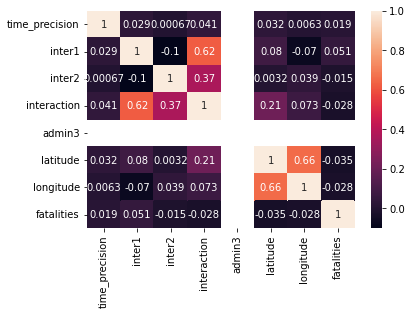

In [ ]:
#Plotting the heatmap for correlation matrix
correlation = data.corr()
sns.heatmap(correlation, xticklabels=correlation.columns, yticklabels=correlation.columns, annot=True)

Here, <br>
INTER1 = A numeric code indicating the type of ACTOR1 <br>
INTER2 = A numeric code indicating the type of ACTOR2 <br>
INTERACTION =  A numeric code indicating the interaction between types of
ACTOR1 and ACTOR2 <br>


In [ ]:
# Histogram of column data
def plotHistogram(df, nHistogramShown, nHistogramPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nHistRow = (nCol + nHistogramPerRow - 1) / nHistogramPerRow
    plt.figure(num=None, figsize=(6*nHistogramPerRow, 8*nHistRow), dpi=80, facecolor='w', edgecolor='k')
    for i in range(min(nCol, nHistogramShown)):
        plt.subplot(nHistRow, nHistogramPerRow, i+1)
        df.iloc[:,i].hist()
        plt.ylabel('counts')
        plt.xticks(rotation=90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad=1.0, w_pad=1.0, h_pad=1.0)
    plt.show()

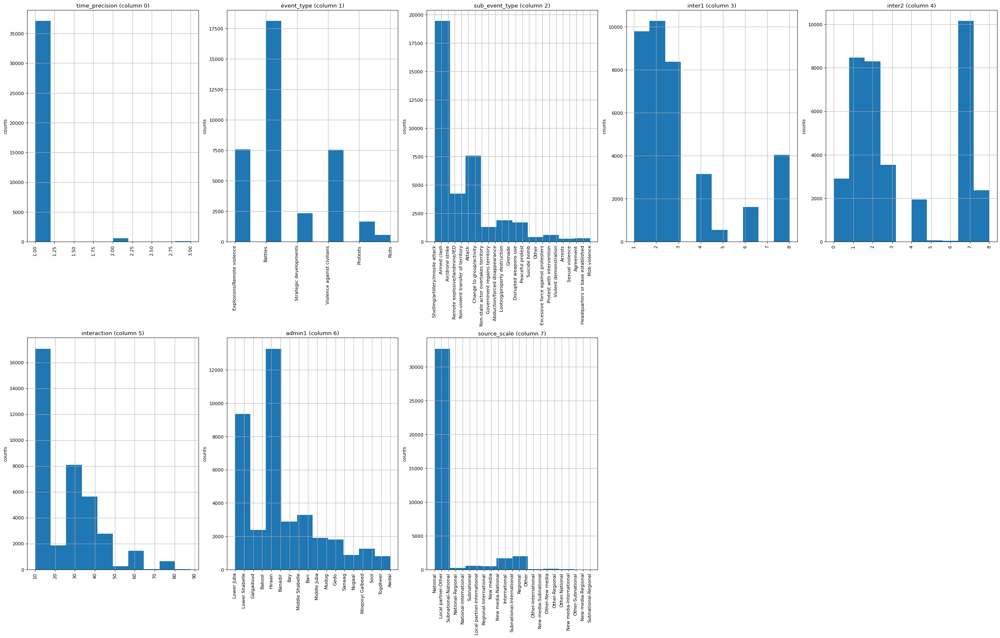

In [ ]:
plotHistogram(data, 10, 5)

In [ ]:
# Scatter and density plots
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.dropna will be keyword-only
  """


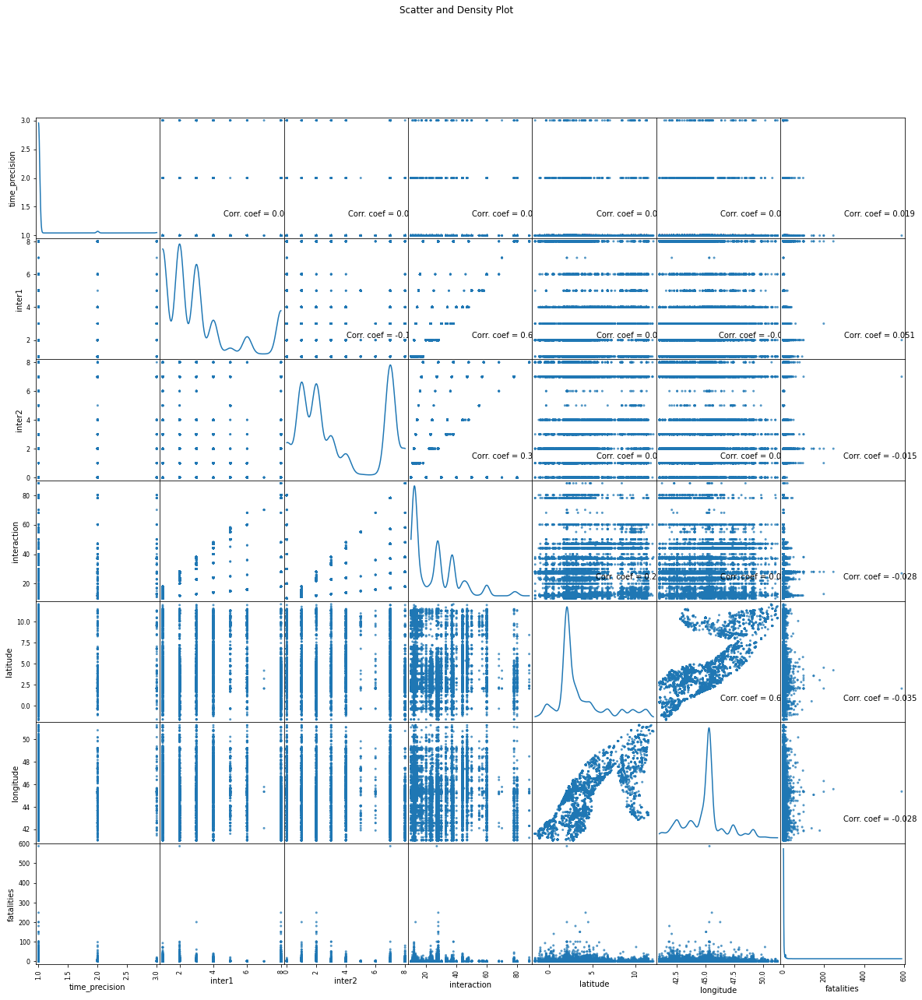

In [ ]:
plotScatterMatrix(data, 20, 10)

In [ ]:
# SELF-EXPLORATION
# NOTE : Maybe this is not required currently I just wanted to visualize the data geographically for the fatalities
# Graph showing the regions with fatalities with hover-around feature
fig = px.scatter_geo(df,lat='latitude',lon='longitude',hover_name='fatalities')
fig.update_layout(title = 'Conflict data of Somalia - 1997-2022', title_x=1)
fig.show()

## Pandas profiling section

In [1]:
!pip install pandas-profiling==3.3.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 268 kB 5.1 MB/s 
     |████████████████████████████████| 690 kB 50.7 MB/s 
     |████████████████████████████████| 62 kB 1.3 MB/s 
     |████████████████████████████████| 4.7 MB 38.0 MB/s 
     |████████████████████████████████| 9.8 MB 39.7 MB/s 
     |████████████████████████████████| 102 kB 62.7 MB/s 
     |████████████████████████████████| 296 kB 43.2 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=199e9c125ba4f14ce7a316bb001f36650aee200bca8c9fff5b9b7fe6e0a60ebe
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
Successfully built htmlmin
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.12.2
    Uninstalling statsmodels-0.12.2:
      Successfully uninstalled statsmodels-0.12.2
  Attempting uninstall: requests
   

In [3]:
data_dir = "https://raw.githubusercontent.com/tejaswinidhupad/Child-Wasting-Prediction/main/data/ZHL/1900-01-01-2022-09-27-Eastern_Africa-Somalia.csv"
acled_df = pd.read_csv(data_dir, parse_dates=['event_date'])
acled_df.head(1)

,data_id,iso,event_id_cnty,event_id_no_cnty,event_date,year,time_precision,event_type,sub_event_type,actor1,...,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,timestamp,iso3
0,9499027,706,SOM38074,38074,2022-09-23,2022,1,Explosions/Remote violence,Shelling/artillery/missile attack,Al Shabaab,...,Abdale Birole,-0.4906,42.1969,1,Calamada; Al Furqaan,National,"On 23 September 2022, Al Shabaab militants fir...",0,1664231916,SOM


In [4]:
acled_profile = ProfileReport(acled_df, title="Acled Data Profiling Report")

acled_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]